# Using the Goodman Pipeline in live reduction

We call _live_ reduction because is intended to happen very quickly after the image arrived at the instrument's computer.

## Pipeline Version


In [1]:
import logging
logging.basicConfig(level=logging.INFO)

log = logging.getLogger(__name__)
# log.setLevel(logging.DEBUG)
print(log.level)

0


In [2]:
import goodman_pipeline
print(goodman_pipeline.__version__)


>>> from astroplan import download_IERS_A
>>> download_IERS_A()
 [astroplan.utils]

>>> from astroplan import download_IERS_A
>>> download_IERS_A()



1.3.0.dev3


# Process Overview

- Actions on files
  + Overscan Correction
  + Bias Subtraction
  + Trim according to `TRIMSEC`
  + Trim according to slit illuminated area
  + Combine master bias 
  + Combine master flats
  + Normalize master flat
  + Apply flat correction
  

- Build Calibrations  
  + Make master bias
  + Make master flats
  
  
 Before start, some imports and definitions are necessary

In [3]:
import os
from ccdproc import CCDData
import matplotlib
# matplotlib.rcParams['figure.figsize'] = [18, 10]
%matplotlib inline
import matplotlib.pyplot as plt
import re
import numpy as np


test_data = '/user/simon/data/soar/work/aeon/2019-08-06'

science_file = '0175_OGLE-2019-BLG-1151-07-08-2019.fits'
lamp_file = '0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits'

full_path = os.path.join(test_data, science_file)
lamp_full_path = os.path.join(test_data, lamp_file)



For reading the files use `goodman_pipeline.core.read_fits`. It will add a set of keywords that ensure smooth operation of the pipeline.

(555.1281879182164, 823.6476269995969)
(-693.8136495597541, 9310.736999686103)


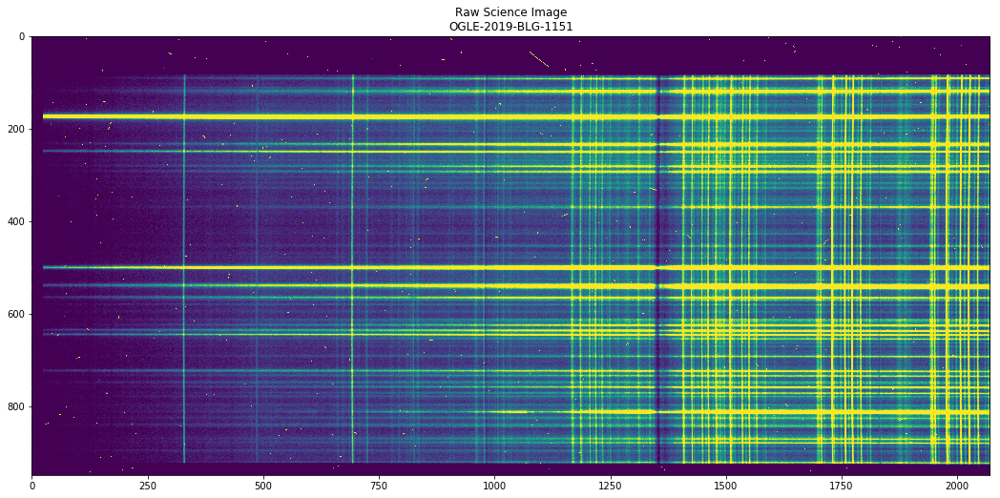

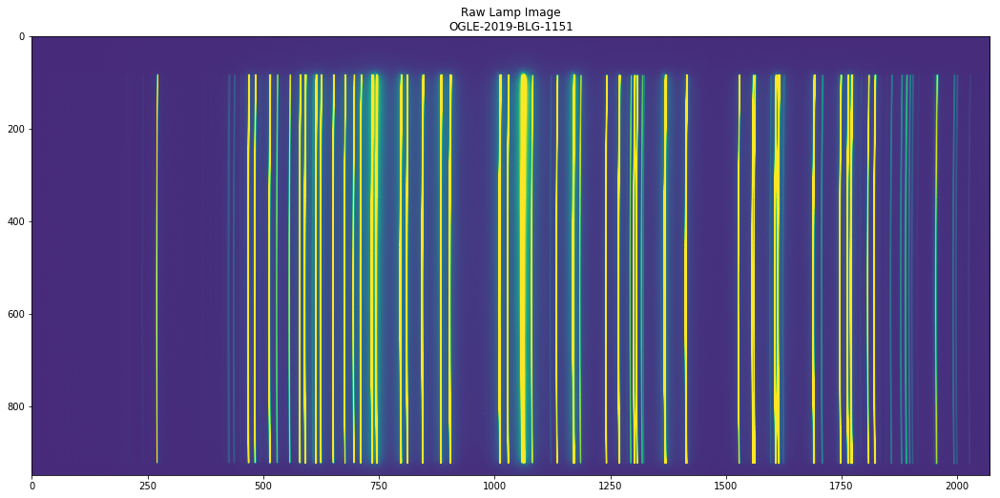

In [4]:
from goodman_pipeline.core import read_fits

ccd = read_fits(full_path=full_path, technique='Spectroscopy')
lamp = read_fits(full_path=lamp_full_path, technique='Spectroscopy')

def show_image(ccd,  clim=None, title=""):
    
    if clim is None:
        z1 = np.mean(ccd.data) - 0.5 * np.std(ccd.data)
        z2 = np.median(ccd.data) + np.std(ccd.data)
        clim = (z1, z2)
        print(clim)
    fig, ax = plt.subplots(figsize=(18, 10))
    ax.imshow(ccd.data, cmap='viridis', clim=clim)
    ax.set_title(title)
    
show_image(ccd=ccd, title="Raw Science Image\n{}".format(ccd.header['OBJECT']))
show_image(ccd=lamp, title="Raw Lamp Image\n{}".format(ccd.header['OBJECT']))

# Image Reduction

## Overscan

The overscan area is an area of the image that represents non-existing pixels. Literally, the camera keeps reading a bit longer after all the real pixels have been read and they are added to the file like if they were real. Overscan is used to trace the level of bias signal. (bias files do this and also trace the 2D structure of the bias signal).

There is a function as well to determine the overscan region. Imaging data does not have overscan area thus only bias files can be used.

In [5]:
from goodman_pipeline.core import get_overscan_region

overscan_region = get_overscan_region(sample_image=full_path, technique='Spectroscopy')
print(overscan_region)

INFO:goodman_pipeline.core.core:Overscan regions has been tested for ROI Spectroscopic 1x1, 2x2 and 3x3
INFO:goodman_pipeline.core.core:Overscan Region: [3:24,1:948]


[3:24,1:948]


(58.89254193315077, 327.63579660685906)
(-1190.2728322753214, 8814.747137269136)


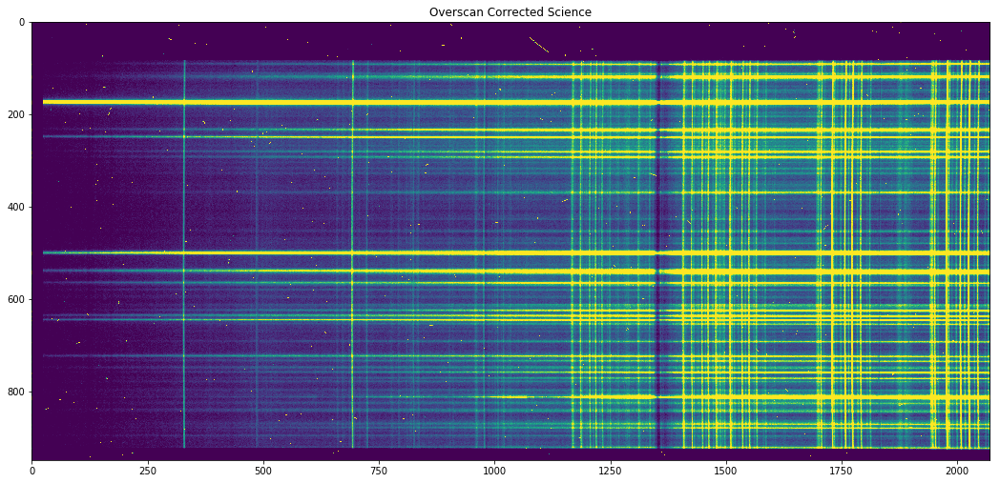

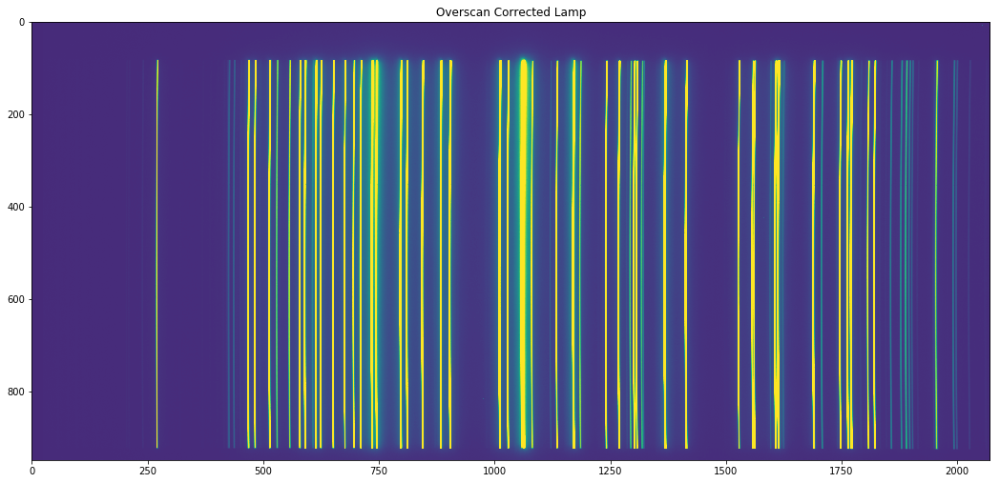

In [6]:
from goodman_pipeline.core import image_overscan

ccd = image_overscan(ccd=ccd,overscan_region=overscan_region)
lamp = image_overscan(ccd=lamp,overscan_region=overscan_region)

show_image(ccd=ccd, title='Overscan Corrected Science')
show_image(ccd=lamp, title='Overscan Corrected Lamp')

## Trimming

Trim section is the area useful of the image. For spectroscopy is a bit tricky and for Imaging is straightforward from the header under the keyword `TRIMSEC`. However there is a function that can be easily imported.


In order to determine trimming area **the full path** to an image is needed and the observing technique.

In [7]:
from goodman_pipeline.core import define_trim_section

trim_section = define_trim_section(os.path.join(test_data, science_file), technique='Spectroscopy')
print(trim_section)
print("header: {}".format(ccd.header['TRIMSEC']))

INFO:goodman_pipeline.core.core:Trim Section: [26:2055,2:948]


[26:2055,2:948]
header: [15:2055,1:948]


(60.32489431072857, 328.23040238878525)
(-1167.7464734111272, 8915.05517028135)


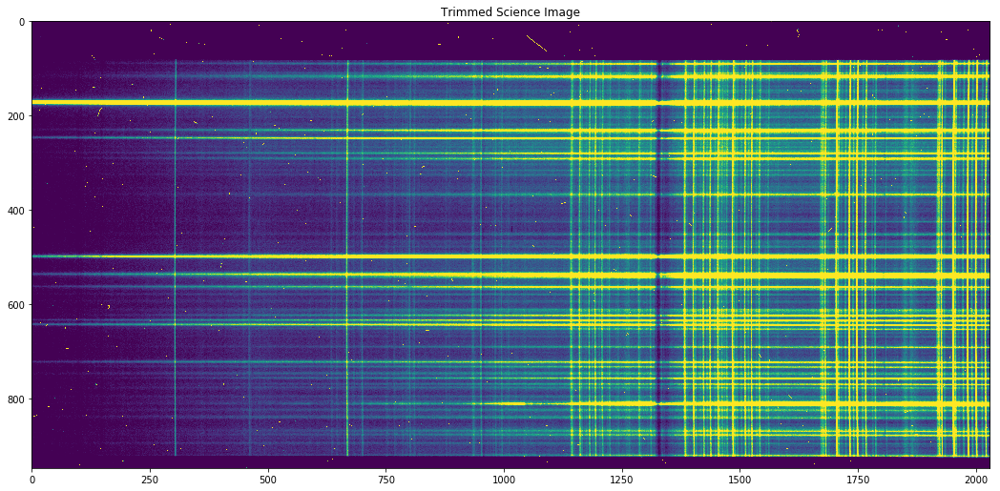

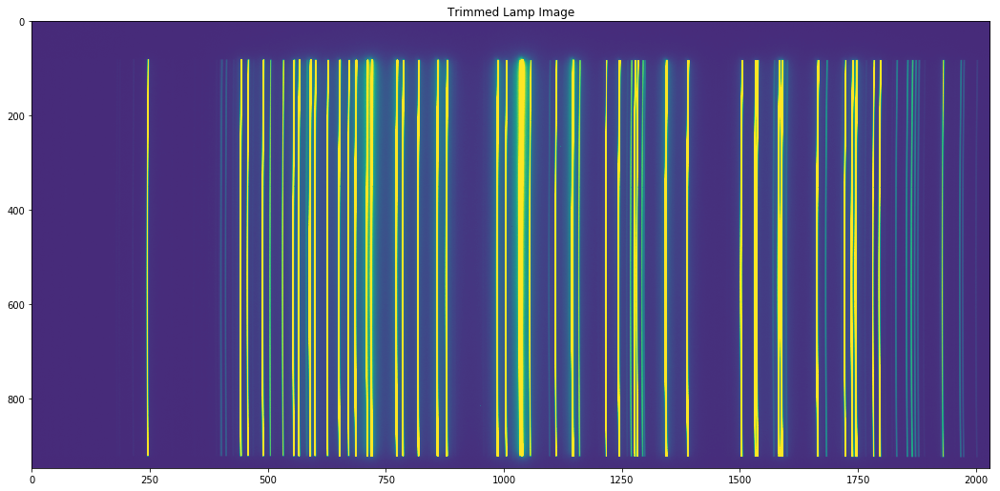

In [8]:
from goodman_pipeline.core import image_trim

ccd = image_trim(ccd=ccd, trim_section=trim_section)
lamp = image_trim(ccd=lamp, trim_section=trim_section)

show_image(ccd=ccd, title="Trimmed Science Image")
show_image(ccd=lamp, title="Trimmed Lamp Image")

**The trimmed section is more noticeable to the left in the image above**

For reference below the area used is the area enclosed in the four red lines, whose thickness was exagerated.

26 2055 2 948
[26:2055,2:948]


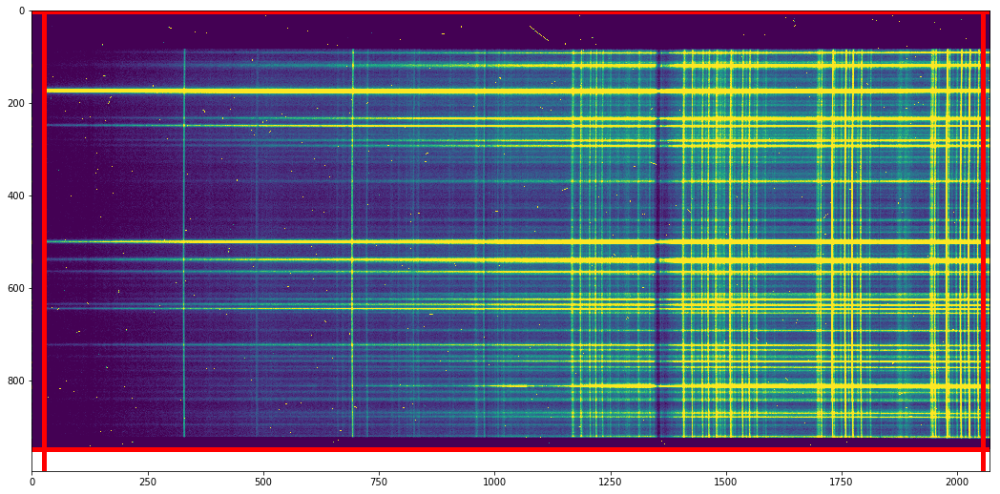

In [9]:

raw_ccd = CCDData.read(full_path, unit='adu')

fig, ax = plt.subplots(figsize=(18, 10))
ax.imshow(raw_ccd.data, cmap='viridis', clim=(555.1281879182164, 823.6476269995969))
section_x, section_y = re.sub('[\[\]]', '', trim_section).split(',')
x1, x2 = section_x.split(':')
y1, y2 = section_y.split(':')
print(int(x1), int(x2), int(y1), int(y2))
ax.axhline(y=int(y1), color='r', linewidth=5.0)
ax.axhline(y=int(y2), color='r', linewidth=5.0)
ax.axvline(x=int(x1), color='r', linewidth=5.0)
ax.axvline(x=int(x2), color='r', linewidth=5.0)
# ax.axvspan(xmin=int(x1), xmax=int(x2), color='r')
print(trim_section)


## Bias Correction

We need a list of bias files, the path to the data, were it should be stored, observing technique, overscan and trim section.

### Create Master Bias

In [10]:
from goodman_pipeline.core import create_master_bias

reduced_data_path = os.path.join(test_data, 'RED2')

bias_files_list = ["0083_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0084_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0085_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0086_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0087_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0088_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0089_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0090_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0091_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0092_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0093_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0094_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0095_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0096_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0097_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0098_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0099_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0100_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0101_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0102_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0103_BIAS_344ATTN3_SP_2x2-06-08-2019.fits"]

master_bias, master_bias_name = create_master_bias(bias_files=bias_files_list, 
                                                   raw_data=test_data, 
                                                   reduced_data=reduced_data_path, 
                                                   technique='Spectroscopy', 
                                                   overscan_region=overscan_region, 
                                                   trim_section=trim_section)

INFO:goodman_pipeline.core.core:New name for master bias: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits
INFO:goodman_pipeline.core.core:Creating master bias
INFO:goodman_pipeline.core.core:Saving FITS file to master_bias_4.fits
INFO:goodman_pipeline.core.core:Created master bias: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits


Master bias file is: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits
(0.01942172114704449, 0.5955373609684825)


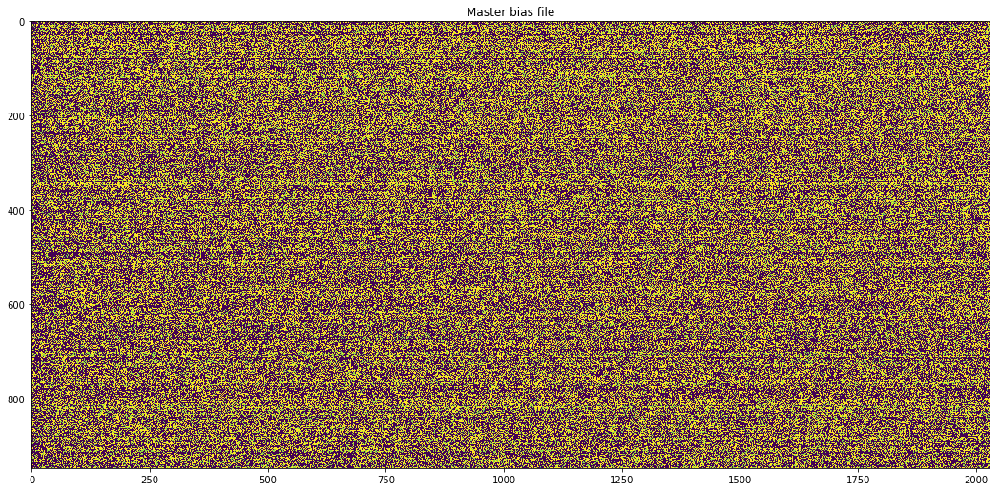

In [11]:
print("Master bias file is: {}".format(master_bias_name))
show_image(ccd=master_bias, title="Master bias file")

### Apply bias correction

In order to apply the correction just import ccdproc and use `subtract_bias`

(60.00794307421647, 328.2299240585469)
(-1168.063205886819, 8914.554254429471)


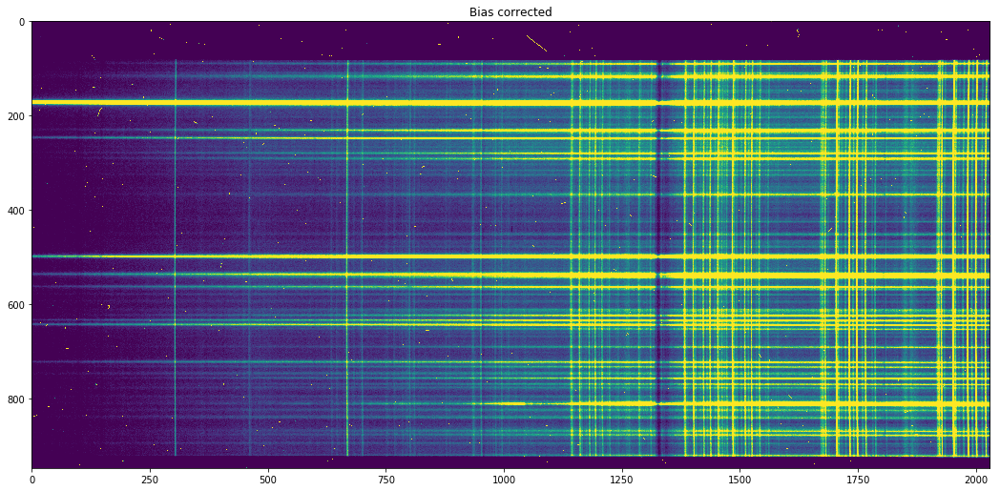

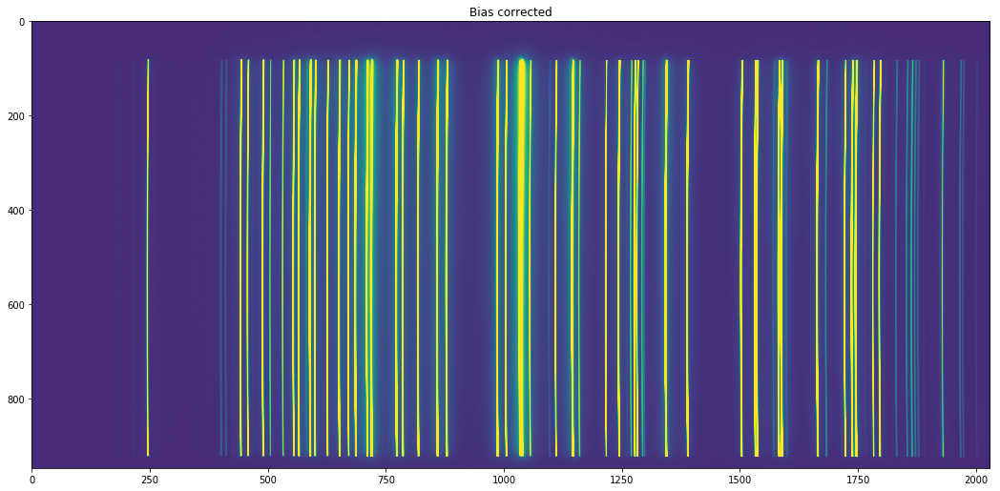

In [12]:
import ccdproc

ccd = ccdproc.subtract_bias(ccd=ccd, master=master_bias, add_keyword=False)
lamp = ccdproc.subtract_bias(ccd=lamp, master=master_bias, add_keyword=False)

show_image(ccd=ccd, title='Bias corrected')
show_image(ccd=lamp, title='Bias corrected')

## Flat Correction

### Create master flats

For creating the master flats we need the saturation values for a given configuration. This is to discard saturated flats. This is critical otherwise the results are invalid.

In [13]:
from goodman_pipeline.core import SaturationValues
saturation_values = SaturationValues(ccd=ccd)

saturation_value = saturation_values.saturation_value

print("This readout mode saturates at: {}".format(saturation_value))

This readout mode saturates at: 69257.0


In [14]:
from goodman_pipeline.core import create_master_flats

# flat_files = ['0163_OGLE-2019-BLG-1151-07-08-2019.fits', 
#               '0167_OGLE-2019-BLG-1151-07-08-2019.fits', 
#               '0173_OGLE-2019-BLG-1151-07-08-2019.fits',
#               '0177_OGLE-2019-BLG-1151-07-08-2019.fits']

flat_files = ["0022_DFLAT-06-08-2019.fits",
              "0023_DFLAT-06-08-2019.fits",
              "0024_DFLAT-06-08-2019.fits",
              "0025_DFLAT-06-08-2019.fits",
              "0026_DFLAT-06-08-2019.fits",
              "0027_DFLAT-06-08-2019.fits",
              "0028_DFLAT-06-08-2019.fits",
              "0029_DFLAT-06-08-2019.fits",
              "0030_DFLAT-06-08-2019.fits",
              "0031_DFLAT-06-08-2019.fits",
              "0032_DFLAT-06-08-2019.fits",
              "0033_DFLAT-06-08-2019.fits",
              "0034_DFLAT-06-08-2019.fits",
              "0035_DFLAT-06-08-2019.fits",
              "0036_DFLAT-06-08-2019.fits",
              "0037_DFLAT-06-08-2019.fits",
              "0038_DFLAT-06-08-2019.fits",
              "0039_DFLAT-06-08-2019.fits",
              "0040_DFLAT-06-08-2019.fits",
              "0041_DFLAT-06-08-2019.fits",
              "0042_DFLAT-06-08-2019.fits"]

new_master_flat_name = 'master_flat_400_M2.fits'

master_flat, master_flat_name = create_master_flats(flat_files=flat_files, 
                                                    raw_data=test_data, 
                                                    reduced_data=reduced_data_path, 
                                                    technique='Spectroscopy',
                                                    overscan_region=overscan_region, 
                                                    trim_section=trim_section,
                                                    master_bias_name=master_bias_name, 
                                                    new_master_flat_name=new_master_flat_name,
                                                    saturation=saturation_value, 
                                                    ignore_bias=False)



INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Creating Master Flat


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.core.core:Saving FITS file to master_flat_400_M2.fits
INFO:goodman_pipeline.core.core:Created Master Flat: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_flat_400_M2.fits


(11967.447376357504, 29079.750630163777)


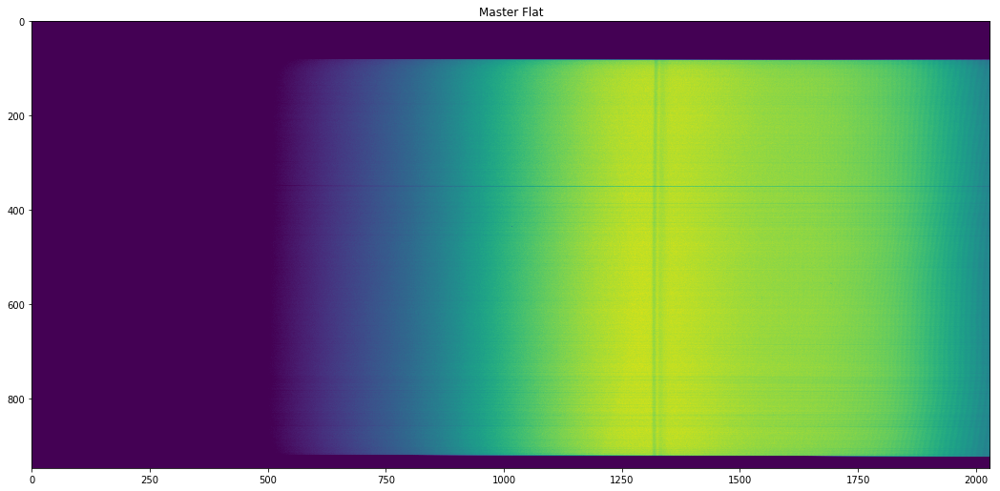

In [15]:
show_image(ccd=master_flat, title="Master Flat")

Now is a good time to find the slit trim section

### Find Slit Trim

This should be obtained using a master flat because the clear contrast between the slit illuminated area vs the non-illuminated.

In [16]:
from goodman_pipeline.core import get_slit_trim_section

slit_trim_section = get_slit_trim_section(master_flat=master_flat)
print(slit_trim_section)

[1:2030,92:910]


### Apply Slit Trim

Applying slit trim reuses the function `image_trim` previously imported just changing the parameter `trim_type` to `slit`

(74.16819847078602, 344.6592754210954)
(-1033.9213841064761, 9492.677600430543)


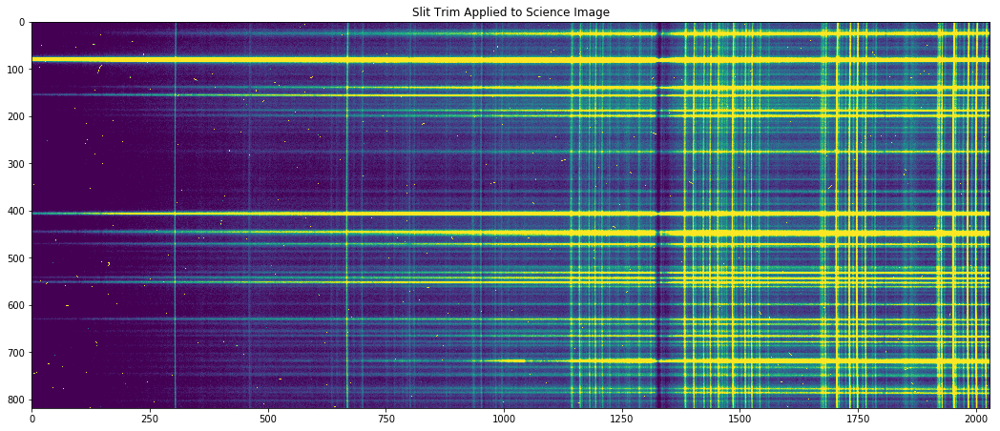

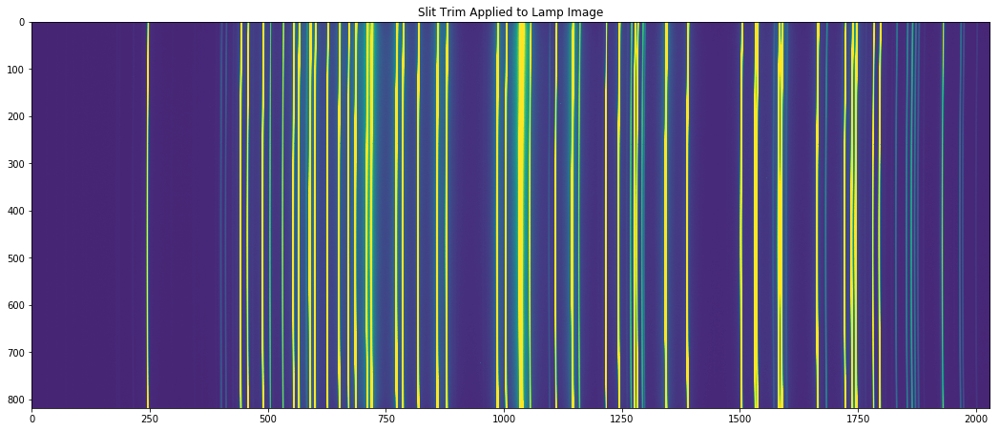

In [17]:
ccd = image_trim(ccd=ccd, trim_section=slit_trim_section, trim_type='slit')
lamp = image_trim(ccd=lamp, trim_section=slit_trim_section, trim_type='slit')

show_image(ccd=ccd, title="Slit Trim Applied to Science Image")
show_image(ccd=lamp, title="Slit Trim Applied to Lamp Image")

### Apply master flat correction

First apply slit trim to master

(14729.123201190825, 29578.20622427467)


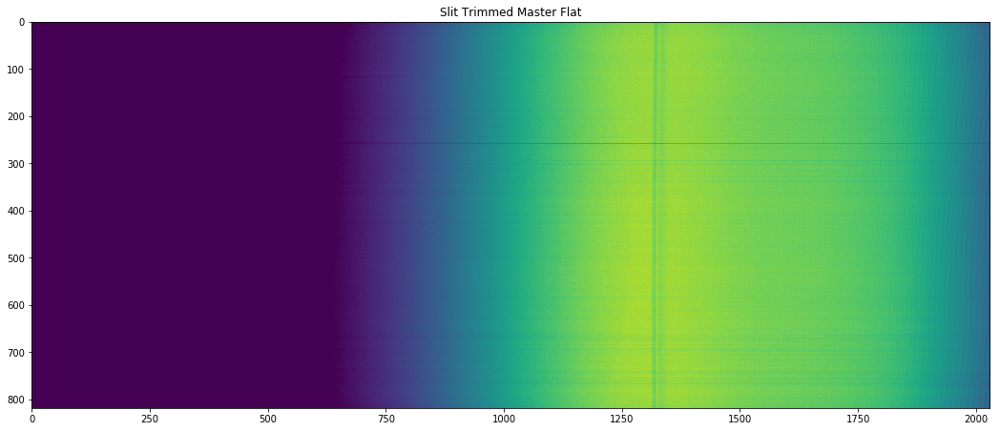

In [18]:
slit_trimmed_master_flat = image_trim(ccd=master_flat, trim_section=slit_trim_section, trim_type='slit')

show_image(ccd=slit_trimmed_master_flat, title='Slit Trimmed Master Flat')

Normalize master flat

INFO:goodman_pipeline.core.core:Saving FITS file to norm_master_flat_400_M2.fits


Normalized flat name: /user/simon/data/soar/work/aeon/2019-08-06/RED2/norm_master_flat_400_M2.fits
(0.9937123374238345, 1.010847071010988)


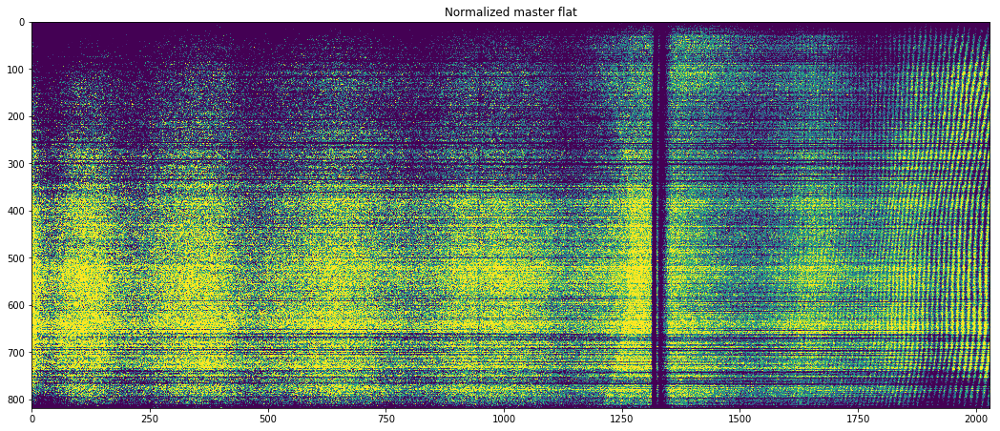

In [19]:
from goodman_pipeline.core import normalize_master_flat
normalized_flat, normalized_master_flat_name = normalize_master_flat(master=slit_trimmed_master_flat, 
                                                                     name=master_flat_name, 
                                                                     method='simple') 

print("Normalized flat name: {}".format(normalized_master_flat_name))
show_image(ccd=normalized_flat, title='Normalized master flat')

In [20]:
print(ccd.data.shape, normalized_flat.data.shape)

(819, 2030) (819, 2030)


In [21]:
for key in ccd.header.keys():
    print("{}  = {}".format(key, ccd.header[key]))

SIMPLE  = True
BITPIX  = 16
NAXIS  = 2
NAXIS1  = 2071
NAXIS2  = 948
BSCALE  = 1
BZERO  = 32768
DATE-OBS  = 2019-08-07T03:53:15.774
DATE  = 2019-08-07
TIME  = 03:53:15.774 to 04:08:15.780
N_PRM0  = 59
PG0_0  = 24624
PG0_1  = 23276.902
PG0_2  = 0
PG0_3  = 2.238
PG0_4  = 2.238
PG0_5  = 5.25
PG0_6  = 0.0
PG0_7  = 19071
PG0_8  = 43
PG0_9  = 257
PG0_10  = 31.5
PG0_11  = 39
PG0_12  = 40
PG0_13  = 40
PG0_14  = 41
PG0_15  = 37.5
PG0_16  = 3.289
PG0_17  = 11.972
PG0_18  = 11.766
PG0_19  = 24.003
PG0_20  = 49.761
PG0_21  = -13.173
PG0_22  = -6.624
PG0_23  = 6.667
PG0_24  = 5.722
PG0_25  = 13.426
PG0_26  = 24.805
PG0_27  = 31.515
PG0_28  = 2147483647
PG0_29  = 10.176
PG0_30  = 0.002
PG0_31  = 12.046
PG0_32  = 0.018
PG0_33  = 29.52
PG0_34  = 17.011
PG0_35  = 2.262
PG0_36  = 0.988
PG0_37  = -13.085
PG0_38  = -6.307
PG0_39  = -4.872
PG0_40  = 1.212
PG0_41  = 3.279
PG0_42  = 3.29
PG0_43  = 5.186
PG0_44  = 5.029
PG0_45  = 6.165
PG0_46  = 13.361
PG0_47  = 24.013
PG0_48  = 31.507
PG0_49  = 0.0
PG0_50  = 

(73.87773330505381, 345.2889857872707)
(-1034.7441541895919, 9496.482218791958)


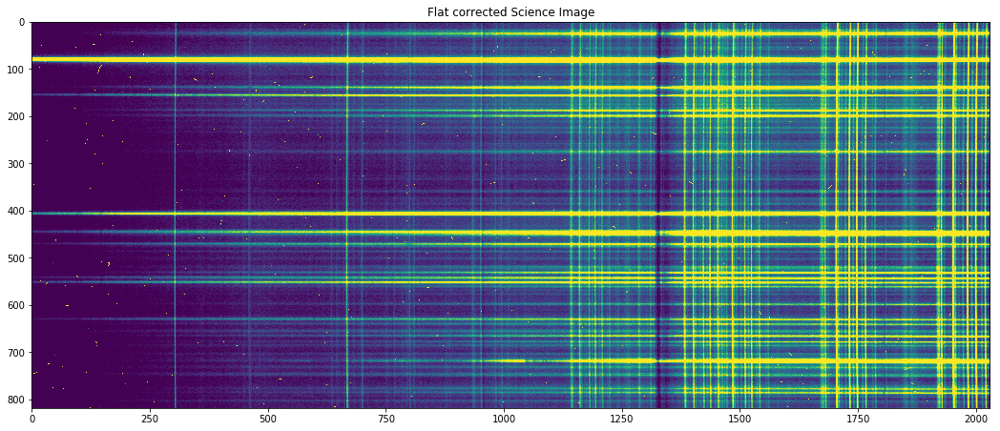

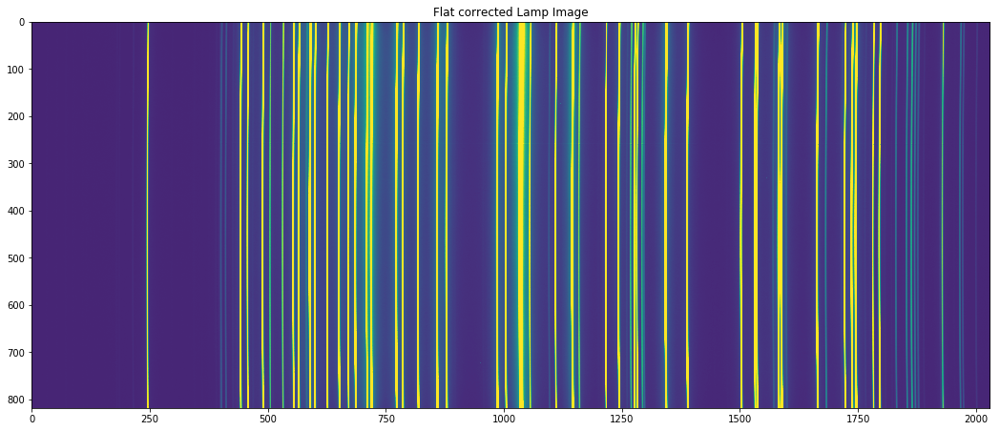

In [22]:
ccd = ccdproc.flat_correct(ccd=ccd, flat=normalized_flat, add_keyword=False)
lamp = ccdproc.flat_correct(ccd=lamp, flat=normalized_flat, add_keyword=False)

show_image(ccd=ccd, title='Flat corrected Science Image')
show_image(ccd=lamp, title='Flat corrected Lamp Image')


## Cosmic Ray Rejection

No need to apply to lamp image. For completeness both are plotted below.

In [23]:
from goodman_pipeline.core import call_cosmic_rejection
ccd, prefix = call_cosmic_rejection(ccd=ccd,
                                    image_name=science_file,
                                    out_prefix='c', 
                                    red_path=reduced_data_path, dcr_par=full_path,method='default')

INFO:goodman_pipeline.core.core:Setting cosmic ray rejection method to: lacosmic
INFO:goodman_pipeline.core.core:Cosmic rays rejected using astroscrappy's lacosmic


(86.77088928222656, 315.9371)
(-1034.7441541895919, 9496.482218791958)


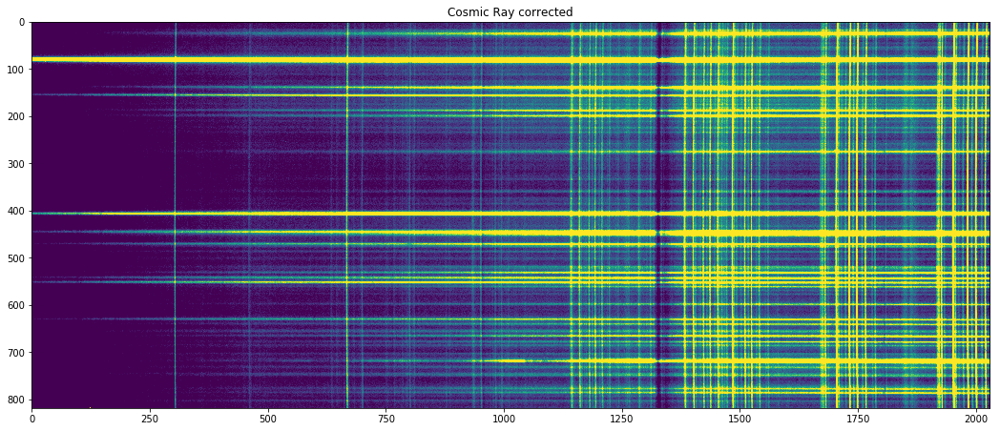

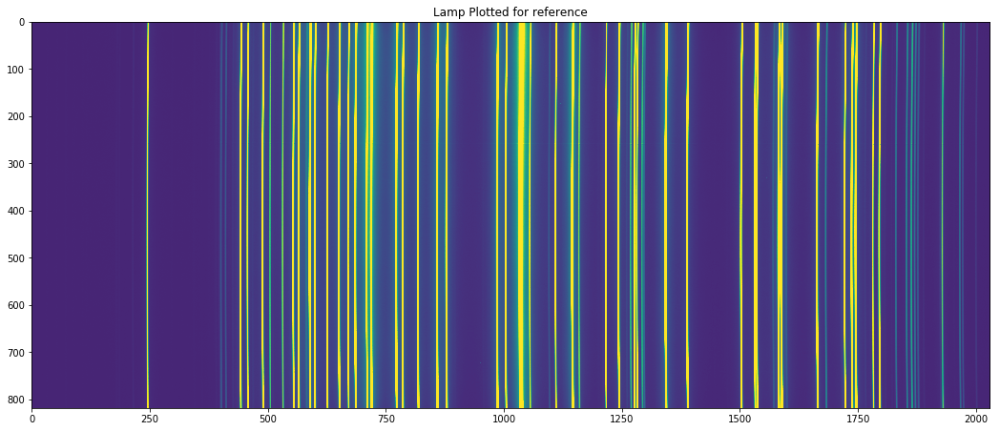

In [24]:
show_image(ccd=ccd, title="Cosmic Ray corrected")
show_image(ccd=lamp, title="Lamp Plotted for reference")

# Spectroscopic Id and Extraction

## Identify Targets

Identification and tracing is performed on the Science Image, then the extraction on the lamp image is performed using the same information.

INFO:goodman_pipeline.core.core:Searching spectroscopic targets in file: 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Fitting Linear1D model to spatial profile to detect background shape
INFO:goodman_pipeline.core.core:Subtracting background shape and level spatial profile for better target identification
INFO:goodman_pipeline.core.core:Finding all peaks in spatial profile
INFO:goodman_pipeline.core.core:Selecting the 30 most intense peaks out of 21 found
INFO:goodman_pipeline.core.core:Validating peaks by setting threshold 1 times the background level 125.12
INFO:goodman_pipeline.core.core:Selecting peak: Centered: 82.0 Intensity 2226.950
INFO:goodman_pipeline.core.core:Selecting peak: Centered: 407.0 Intensity 814.771
INFO:goodman_pipeline.core.core:Selecting peak: Centered: 140.0 Intensity 350.605
INFO:goodman_pipeline.core.core:Selecting peak: Centered: 446.0 Intensity 342.934
INFO:goodman_pipeline.core.core:Selecting peak: Centered: 157.0 Intensity 311.6

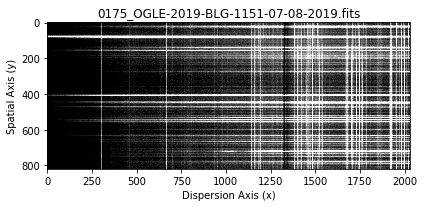

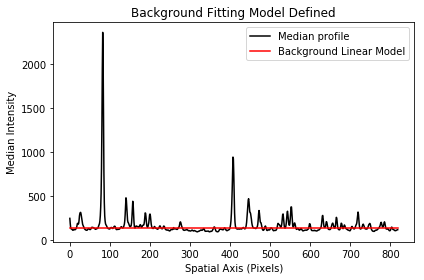

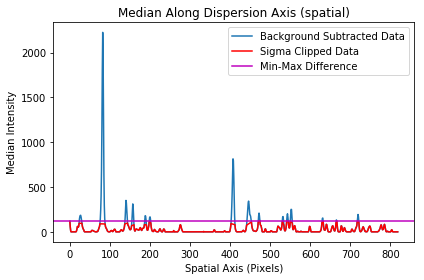

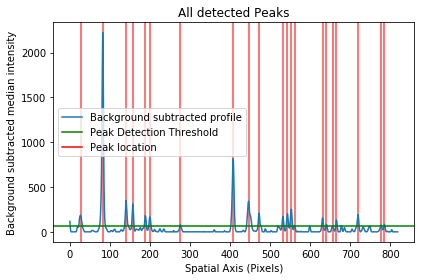

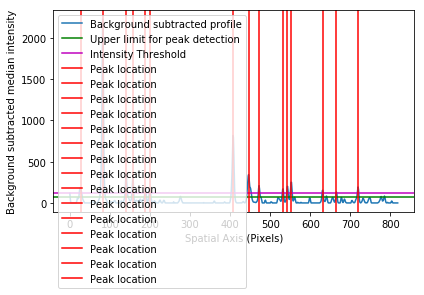

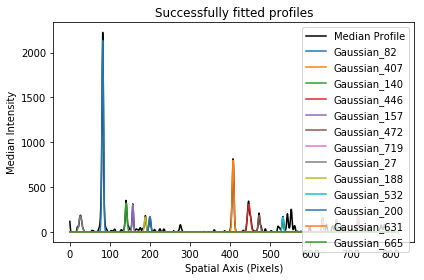

In [25]:
from goodman_pipeline.core import identify_targets

target_list = identify_targets(ccd=ccd, fit_model='gaussian', background_threshold=1, nfind=30, plots=True)

## Trace Targets

INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.187
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.148
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.229
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.291
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.187
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.237
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.549
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.470
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.301
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.913
INFO:goodman_pipeline.core.core:Target tracing RMS error: 2.316
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.260
INFO:goodman_pipeline.core.core:Target tracing RMS error: 0.422


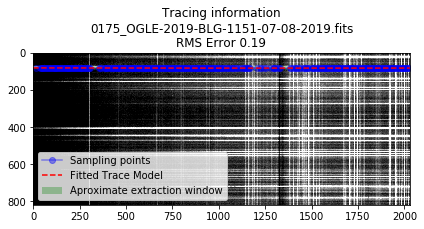

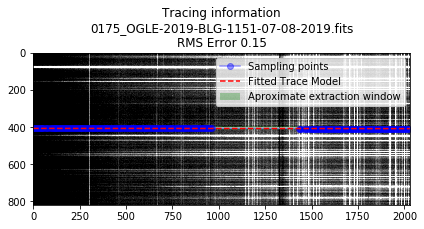

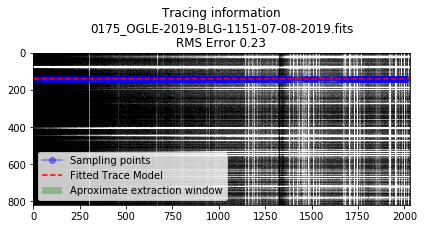

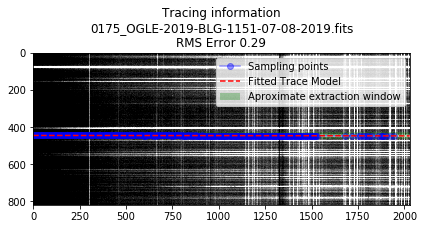

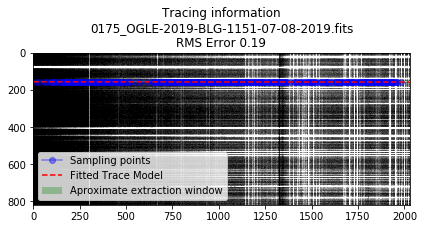

...

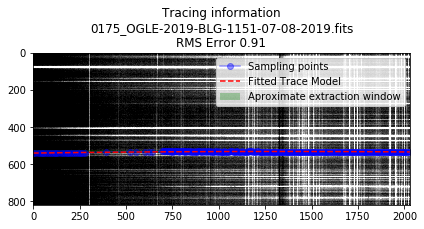

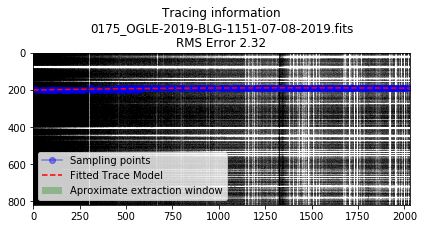

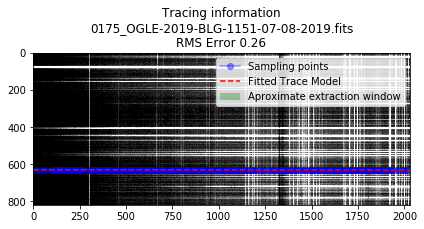

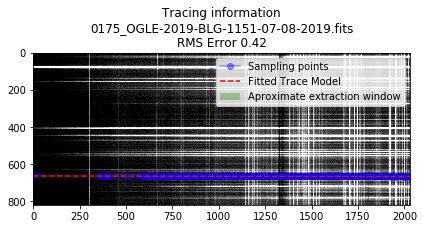

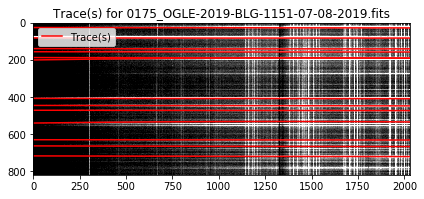

In [26]:
from goodman_pipeline.core import trace_targets

all_traces = trace_targets(ccd=ccd, target_list=target_list, nfwhm=2, plots=True)


## Extraction

For extracting targets we need to loop through 

In [28]:
from goodman_pipeline.core import record_trace_information, extraction
all_extracted = []
for single_trace, single_profile, trace_info in all_traces:

    ccd = record_trace_information(ccd=ccd, trace_info=trace_info)
    lamp = record_trace_information(ccd=lamp, trace_info=trace_info)
    
    extracted = extraction(ccd=ccd, 
                           target_trace=single_trace, 
                           spatial_profile=single_profile, 
                           extraction_name='fractional')
    
    extracted_lamp = extraction(ccd=lamp,
                                target_trace=single_trace, 
                                spatial_profile=single_profile,
                                extraction_name='fractional')
    all_extracted.append([extracted.copy(), extracted_lamp.copy()])


    

INFO:goodman_pipeline.core.core:Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Extraction aperture in first column: 76.21:85.63
INFO:goodman_pipeline.core.core:Background extraction zone 1: 52.65:62.08 column 1
INFO:goodman_pipeline.core.core:Background extraction zone 2: 99.77:109.19 column 1
INFO:goodman_pipeline.core.core:Fractional Pixel Extraction for 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.core.core:Extraction aperture in first column: 76.21:85.63
INFO:goodman_pipeline.core.core:Background extraction zone 1: 'none'
INFO:goodman_pipeline.core.core:Background extraction zone 2: 'none'
INFO:goodman_pipeline.core.core:Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Extraction aperture in first column: 401.66:412.23
INFO:goodman_pipeline.core.core:Background extraction zone 1: 375.23:385.80 column 1
INFO:goodman_pipeline.core.core:Background extra

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.086780833984413:-9.023954409545496]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.085278159034885:-9.022451734595961]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.083775952447844:-9.02094952800892]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.08227421422329:-9.019447789784373]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.08077294436125:-9.017946519922326]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.079272142861697:-9.016445718422773]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.07777180972463:-9.014945385285714]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.07627194495008:-9.013445520511155]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.074772548538:-9.011946124099083]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.073273620488443:-9.010447196049519]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-26.07177516080136:-9.008948736362441]
ERROR:goodman_pipel

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.95049530403515:-8.887668879596227]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.949035718435233:-8.886209293996316]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.94757660119783:-8.884750176758907]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.946117952322915:-8.88329152788399]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.944659771810485:-8.881833347371568]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.94320205966057:-8.880375635221647]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.941744815873136:-8.878918391434219]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.940288040448202:-8.877461616009285]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.93883173338577:-8.876005308946851]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.93737589468583:-8.874549470246912]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.935920524348383:-8.873094099909466]
ERROR:goodman_pi

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.818173994251822:-8.755347569812905]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.816757498001543:-8.753931073562626]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.815341470113772:-8.752515045674848]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.813925910588488:-8.751099486149563]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.812510819425697:-8.749684394986772]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.811096196625392:-8.748269772186475]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.809682042187596:-8.746855617748679]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.808268356112293:-8.745441931673376]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.8068551383995:-8.744028713960574]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.80544238904919:-8.742615964610266]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.804030108061376:-8.741203683622452]
ERROR:goodman

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.68981690463447:-8.626990480195545]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.68844349773382:-8.625617073294897]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.687070559195668:-8.624244134756744]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.685698089020015:-8.62287166458109]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.684326087206856:-8.621499662767931]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.68295455375619:-8.620128129317266]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.68158348866801:-8.618757064229094]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.68021289194234:-8.617386467503422]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.678842763579176:-8.616016339140252]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.677473103578485:-8.614646679139568]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.676103911940302:-8.613277487501385]
ERROR:goodman_pi

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.56542403518305:-8.502597610744132]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.564093717632034:-8.501267293193116]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.56276386844351:-8.499937444004594]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.561434487617497:-8.498608063178573]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.560105575153955:-8.497279150715038]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.55877713105292:-8.495950706614003]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.557449155314394:-8.49462273087547]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.556121647938355:-8.49329522349943]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.55479460892481:-8.491968184485884]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.553468038273756:-8.490641613834832]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.552141935985205:-8.48931551154628]
ERROR:goodman_pip

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.329775563992357:-8.26694913955344]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.328530956778103:-8.265704532339186]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.327286817926343:-8.264460393487425]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.326043147437083:-8.263216722998166]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.324799945310318:-8.2619735208714]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.323557211546046:-8.260730787107128]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.322314946144274:-8.259488521705357]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.321073149105004:-8.25824672466608]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.319831820428213:-8.257005395989296]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.318590960113937:-8.255764535675013]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.317350568162148:-8.254524143723224]
ERROR:goodman_

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.217232265689184:-8.154405841250266]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.21603074782456:-8.153204323385644]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.214829698322433:-8.152003273883516]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.213629117182812:-8.150802692743888]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.212429004405664:-8.149602579966746]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.211229359991037:-8.148402935552113]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.21003018393889:-8.147203759499966]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.208831476249244:-8.14600505181032]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.207633236922092:-8.144806812483168]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.206435465957426:-8.14360904151851]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.205238163355276:-8.142411738916351]
ERROR:goodman_

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.10865318755198:-8.045826763113055]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.107494759036975:-8.044668334598057]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.106336798884477:-8.04351037444556]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.105179307094474:-8.042352882655557]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.10402228366698:-8.041195859228054]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.10286572860197:-8.040039304163045]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.101709641899447:-8.03888321746053]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.10055402355944:-8.037727599120515]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.099398873581904:-8.036572449142987]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.09824419196689:-8.035417767527967]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.09708997871435:-8.034263554275434]
ERROR:goodman_pipe

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.00403832958071:-7.941211905141792]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.002922990415357:-7.940096565976432]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.001808119612477:-7.93898169517356]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-25.000693717172105:-7.937867292733188]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.99957978309424:-7.9367533586553165]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.99846631737885:-7.935639892939932]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.997353320025965:-7.934526895587048]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.99624079103559:-7.933414366596665]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.995128730407686:-7.9323023059687685]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.99401713814229:-7.931190713703373]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.992906014239402:-7.930079589800478]
ERROR:goodman_

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.903387691775414:-7.84056126733649]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.90231544195968:-7.839489017520755]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.90124366050643:-7.838417236067514]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.90017234741569:-7.837345922976773]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.899101502687444:-7.836275078248526]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.898031126321705:-7.83520470188278]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.896961218318452:-7.834134793879528]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.895891778677694:-7.833065354238769]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.89482280739942:-7.831996382960504]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.893754304483664:-7.83092788004474]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.892686269930394:-7.82985984549147]
ERROR:goodman_pipe

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.806701274136067:-7.743874849697143]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.805672113669964:-7.742845689231039]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.804643421566354:-7.7418169971274295]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.80361519782523:-7.740788773386313]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.802587442446615:-7.739761018007698]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.801560155430508:-7.738733730991584]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.800533336776873:-7.737706912337956]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.799506986485753:-7.736680562046828]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.798481104557112:-7.735654680118195]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.797455690990986:-7.734629266552062]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.796430745787347:-7.733604321348423]
ERROR:good

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.71397907666266:-7.651152652223743]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.71299300554619:-7.650166581107271]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.71200740279221:-7.649180978353293]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.71102226840074:-7.648195843961815]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.71003760237174:-7.6472111779328245]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.70905340470525:-7.646226980266334]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.70806967540127:-7.645243250962345]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.70708641445976:-7.644259990020842]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.706103621880757:-7.64327719744184]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.705121297664263:-7.642294873225339]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.70413944181024:-7.641313017371324]
ERROR:goodman_pipel

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.625221099355223:-7.562394674916305]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.62427811758839:-7.561451693149465]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.623335604184042:-7.560509179745118]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.62239355914219:-7.559567134703265]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.621451982462823:-7.5586255580239055]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.620510874145964:-7.557684449707047]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.6195702341916:-7.556743809752682]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.618630062599742:-7.555803638160818]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.61769035937037:-7.554863934931447]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.616751124503494:-7.55392470006457]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.615812357999104:-7.552985933560187]
ERROR:goodman_p

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.540427342213754:-7.477600917774829]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.539527449796537:-7.476701025357613]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.538628025741808:-7.475801601302891]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.537729070049586:-7.474902645610669]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.536830582719872:-7.474004158280948]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.53593256375263:-7.473106139313714]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.535035013147898:-7.47220858870898]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.534137930905658:-7.471311506466741]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.533241317025926:-7.4704148925870015]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.53234517150868:-7.469518747069756]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.53144949435392:-7.4686230699150045]
ERROR:goodma

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.459597805238225:-7.396771380799301]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.45874100217064:-7.395914577731716]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.457884667465542:-7.395058243026625]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.45702880112296:-7.394202376684035]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.456173403142856:-7.3933469787039385]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.455318473525253:-7.392492049086336]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.45446401227015:-7.391637587831234]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.453610019377543:-7.390783594938625]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.452756494847442:-7.389930070408518]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.451903438679814:-7.389077014240897]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.451050850874694:-7.388224426435777]
ERROR:goodma

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.382732488428644:-7.319906063989727]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.381918774710698:-7.319092350271774]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.38110552935523:-7.318279104916314]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.38029275236228:-7.317466327923356]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.379480443731815:-7.316654019292891]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.378668603463844:-7.315842179024919]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.37785723155836:-7.315030807119442]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.37704632801539:-7.314219903576465]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.3762358928349:-7.313409468395982]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.375425926016923:-7.312599501577999]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.37461642756142:-7.311790003122503]
ERROR:goodman_pip

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.30983139178504:-7.247004967346115]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.309060767416703:-7.246234342977786]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.308290611410875:-7.245464186971958]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.307520923767555:-7.244694499328631]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.306751704486707:-7.24392528004779]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.305982953568368:-7.24315652912945]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.30521467101252:-7.242388246573604]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.304446856819183:-7.241620432380259]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.30367951098833:-7.240853086549407]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.302912633519966:-7.240086209081049]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.302146224414116:-7.239319799975192]
ERROR:goodman_p

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.240894515307367:-7.17806809086845]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.240166980288684:-7.17734055584976]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.239439913632474:-7.1766134891935565]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.23871331533877:-7.175886890899854]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.237987185407576:-7.175160760968652]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.237261523838868:-7.174435099399943]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.236536330632653:-7.173709906193729]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.235811605788925:-7.172985181350008]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.23508734930771:-7.172260924868787]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.234363561188985:-7.171537136750061]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.233640241432745:-7.170813816993828]
ERROR:goodman

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.17592185899567:-7.113095434556747]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.1752374133266:-7.112410988887682]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.17455343602004:-7.111727011581117]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.17386992707597:-7.111043502637045]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.173186886494392:-7.110360462055468]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.1725043142753:-7.109677889836384]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.171822210418718:-7.1089957859798005]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.171140574924628:-7.108314150485711]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.170459407793047:-7.107632983354122]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.16977870902395:-7.106952284585027]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.16909847861735:-7.106272054178426]
ERROR:goodman_pipe

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.114913422849924:-7.052086998410999]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.11427206653049:-7.051445642091565]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.11363117857354:-7.050804754134624]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.11299075897911:-7.0501643345401845]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.112350807747163:-7.049524383308238]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.11171132487771:-7.048884900438786]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.11107231037076:-7.048245885931834]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.1104337642263:-7.047607339787376]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.109795686444336:-7.046969262005412]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.10915807702486:-7.046331652585941]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.10852093596789:-7.045694511528971]
ERROR:goodman_pipe

ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.05786920687013:-6.995042782431206]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.057270939900327:-6.994444515461403]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.056673141293018:-6.993846716854094]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.056075811048196:-6.993249386609278]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.055478949165888:-6.992652524726964]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.054882555646067:-6.992056131207143]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.054286630488733:-6.991460206049815]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.053691173693906:-6.990864749254989]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.053096185261573:-6.990269760822656]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.05250166519175:-6.989675240752824]
ERROR:goodman_pipeline.core.core:Invalid Zone 1: [-24.051907613484396:-6.9890811890454785]
ERROR:goodm

INFO:goodman_pipeline.core.core:Extraction aperture in first column: 625.01:634.04
INFO:goodman_pipeline.core.core:Background extraction zone 1: 602.44:611.47 column 1
INFO:goodman_pipeline.core.core:Background extraction zone 2: 647.58:656.61 column 1
INFO:goodman_pipeline.core.core:Fractional Pixel Extraction for 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.core.core:Extraction aperture in first column: 625.01:634.04
INFO:goodman_pipeline.core.core:Background extraction zone 1: 'none'
INFO:goodman_pipeline.core.core:Background extraction zone 2: 'none'
INFO:goodman_pipeline.core.core:Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Extraction aperture in first column: 658.90:666.64
INFO:goodman_pipeline.core.core:Background extraction zone 1: 639.57:647.30 column 1
INFO:goodman_pipeline.core.core:Background extraction zone 2: 678.24:685.98 column 1
INFO:goodman_pipeline.core.core:Fractional Pixel Extraction 

For some reason can't plot in for loop. Will have to do it manually.

In [37]:
def draw_spectrum(ccd, title=''):
    fig, ax1 = plt.subplots(figsize=(18,10))
    
#     ax1.plot(lamp.data, alpha=0.7, color='k', label='Comparison Lamp: {}'.format(ccd.header['OBJECT']))
    ax1.plot(ccd.data)
    ax1.set_title(title)
    ax1.legend(loc='best')



# Wavelength Calibration

Need to do some refactoring to the pipeline in order to be able to use it like this. Is possible but is highly dependent on arguments.

In [32]:
from goodman_pipeline.spectroscopy import WavelengthCalibration
wavelength_calibration = WavelengthCalibration()

In [33]:
import goodman_pipeline
pipeline_path = os.path.dirname(goodman_pipeline.__file__)
print(pipeline_path)
reference_data = os.path.join(pipeline_path, 'data/ref_comp')
assert os.path.isdir(reference_data)

/user/simon/bin/anaconda3/envs/astroconda/lib/python3.5/site-packages/goodman_pipeline


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.820
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_1.fits for science file 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Saving FITS file to w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_1.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated OBJECT file saved to: 0175_OGLE-2019-BLG-1151-07-08-2019_ws_1.fits using reference lamp w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_1.fits
INFO:goodman_pipeline.core.core:Saving FITS file to 0175_OGLE-2019-BLG-1151-07-08-2019_ws_1.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-B

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.704
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_3.fits for 

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.core.core:Saving FITS file to 0175_OGLE-2019-BLG-1151-07-08-2019_ws_3.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.632
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_4.fits for science file 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Saving FITS file to w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_4.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated OBJECT file saved to: 0175_OGLE-2019-BLG-1151-07-08-2019_ws_4.fits using reference lamp w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_4.fits
INFO:goodman_pipeline.core.core:Saving FITS file to 0175_OGLE-2019-BLG-1151-07-08-2019_ws_4.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-B

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.632
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_6.fits for 

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.651


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_7.fits for science file 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Saving FITS file to w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_7.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated OBJECT file saved to: 0175_OGLE-2019-BLG-1151-07-08-2019_ws_7.fits using reference lamp w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_7.fits
INFO:goodman_pipeline.core.core:Saving FITS file to 0175_OGLE-2019-BLG-1151-07-08-2019_ws_7.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Re

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.714
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_9.fits for 

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.557
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_10.fits for science file 0175_OGLE-2019-BLG-1151-07-08-2019.fits
INFO:goodman_pipeline.core.core:Saving FITS file to w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_10.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated OBJECT file saved to: 0175_OGLE-2019-BLG-1151-07-08-2019_ws_10.fits using reference lamp w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_10.fits
INFO:goodman_pipeline.core.core:Saving FITS file to 0175_OGLE-2019-BLG-1151-07-08-2019_ws_10.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.830
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_12.fits for

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.spectroscopy.wavelength:Processing Science Target: OGLE-2019-BLG-1151
INFO:goodman_pipeline.spectroscopy.wavelength:Using reference lamp 0176_OGLE-2019-BLG-1151-07-08-2019_comp.fits
INFO:goodman_pipeline.spectroscopy.wavelength:Processing Comparison Lamp: OGLE-2019-BLG-1151
INFO:goodman_pipeline.core.core:Searching matching reference lamp
INFO:goodman_pipeline.core.core:Reference Lamp Found: goodman_comp_400M2_GG455_HgArNe.fits
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.core.core:Recovering line information from reference Lamp.
INFO:goodman_pipeline.spectroscopy.wavelength:Creating Wavelength Solution
INFO:goodman_pipeline.spectroscopy.wavelength:Re-fitting wavelength solution
INFO:goodman_pipeline.core.core:Wavelength solution RMS Error : 0.885
INFO:goodman_pipeline.spectroscopy.wavelength:Wavelength-calibrated COMP file saved to: w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_13.fits for

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


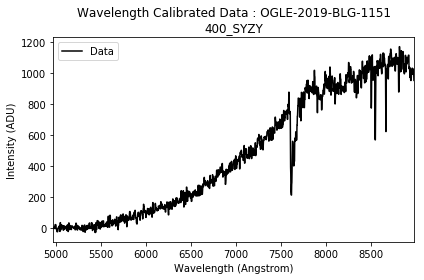

In [34]:
for i, (ccd, lamp) in enumerate(all_extracted, 1):
    wavelength_calibration(ccd=ccd, 
                           comp_list=[lamp], 
                           save_data_to=reduced_data_path, 
                           reference_data=reference_data, 
                           object_number=i, 
                           plot_results=True,
                           plots=True)

In [35]:
for _file in sorted(os.listdir(reduced_data_path)):
    print(_file)

0175_OGLE-2019-BLG-1151-07-08-2019.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_1.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_10.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_11.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_12.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_13.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_2.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_3.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_4.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_5.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_6.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_7.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_8.fits
0175_OGLE-2019-BLG-1151-07-08-2019_ws_9.fits
master_bias.fits
master_bias_2.fits
master_bias_3.fits
master_bias_4.fits
master_flat_400_M2.fits
norm_master_flat_400_M2.fits
w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_1.fits
w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_10.fits
w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_11.fits
w0176_OGLE-2019-BLG-1151-07-08-2019_comp_ws_12.fits
w0176_OGLE-2019-BLG-1151-07-08-2019_c

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:goodman_pipeline.wcs.wcs:Reading Linear Solution


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


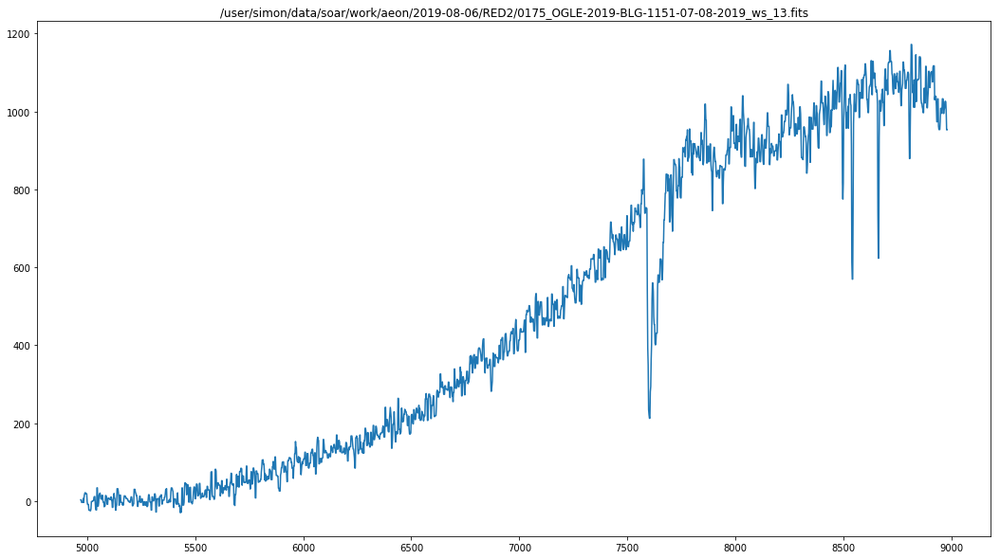

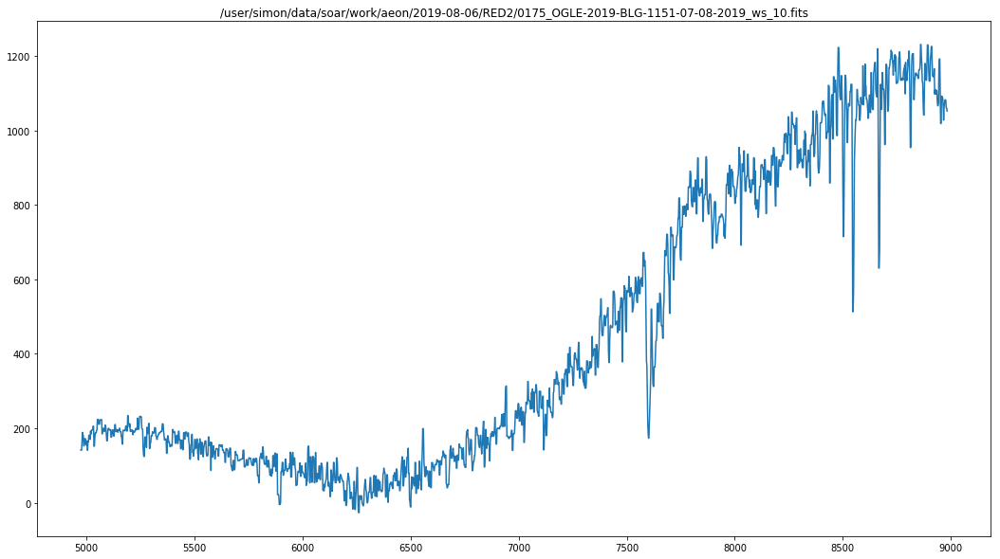

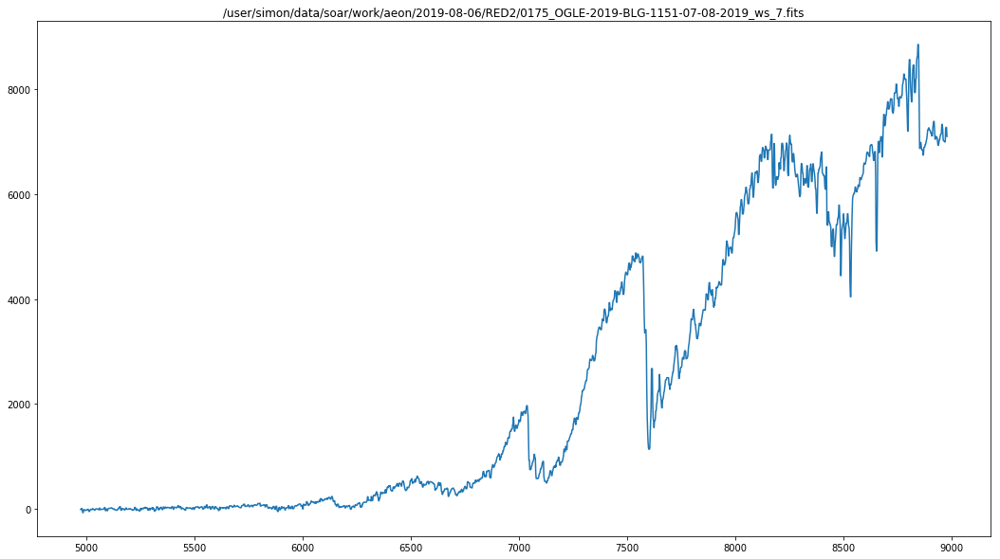

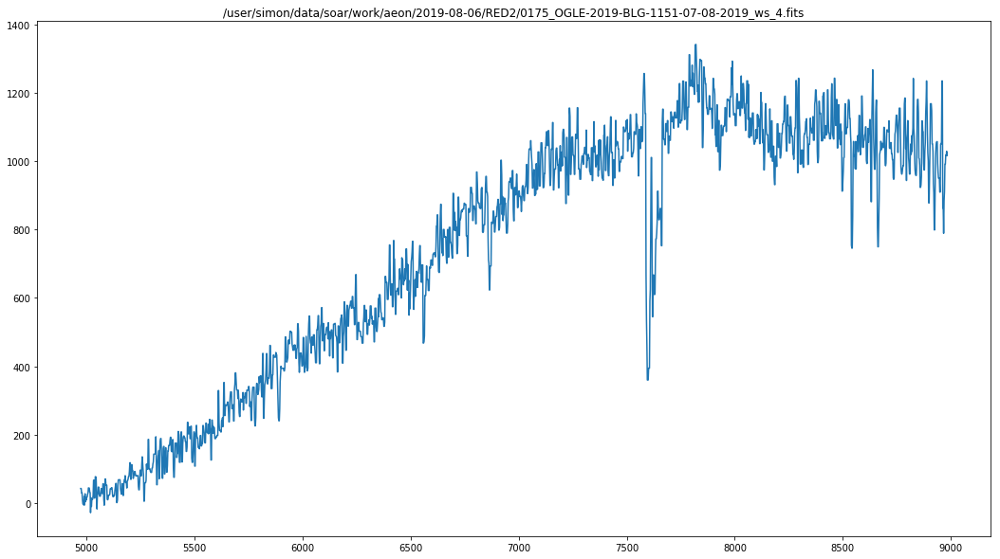

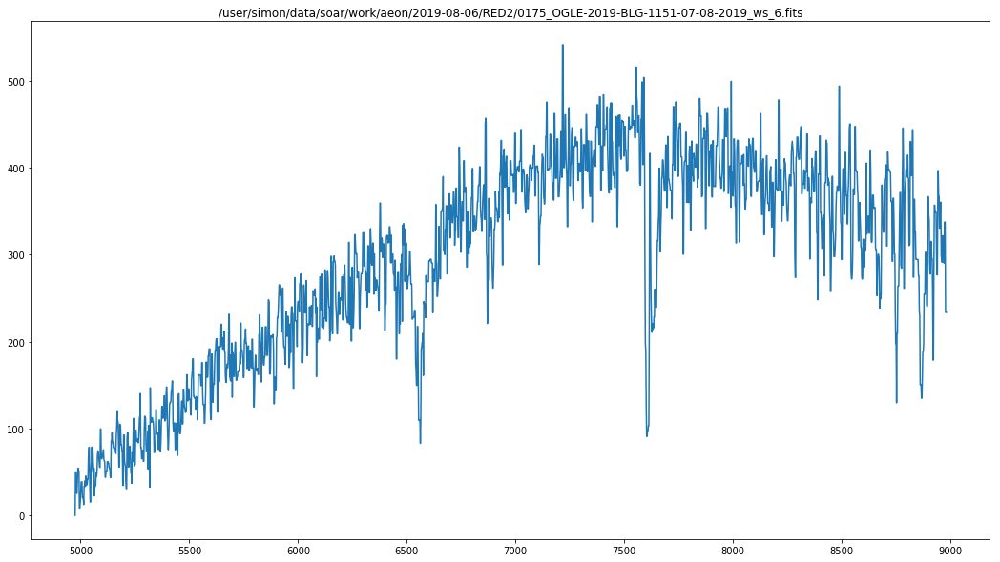

...

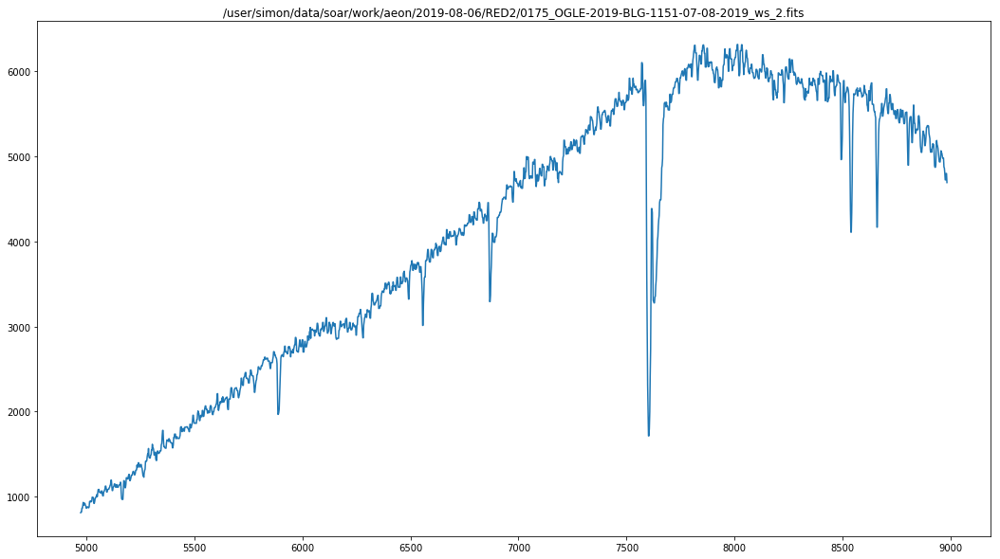

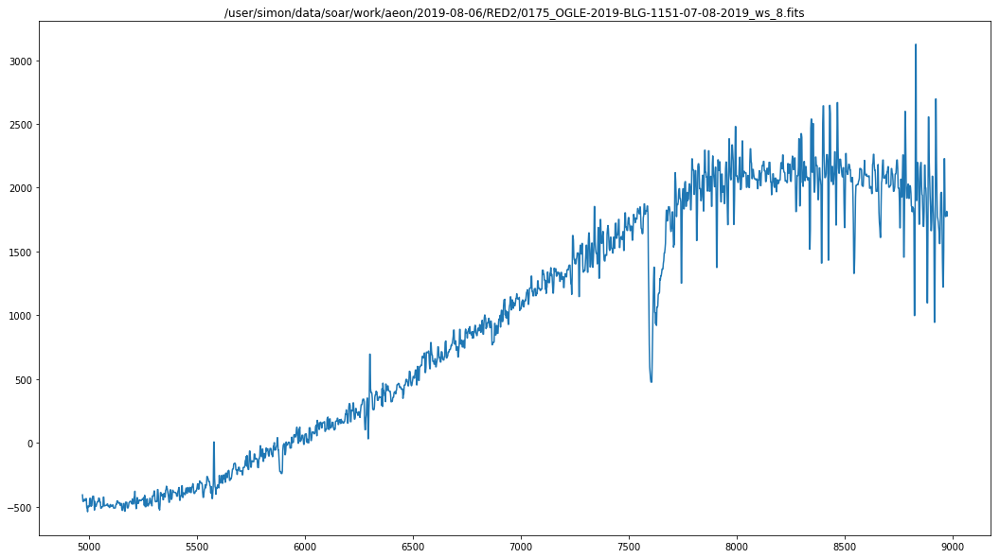

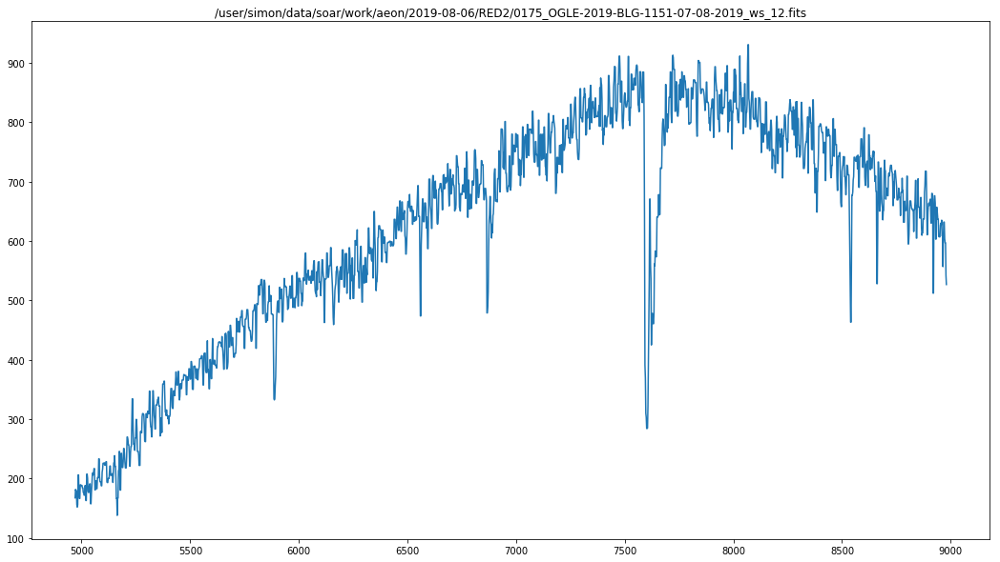

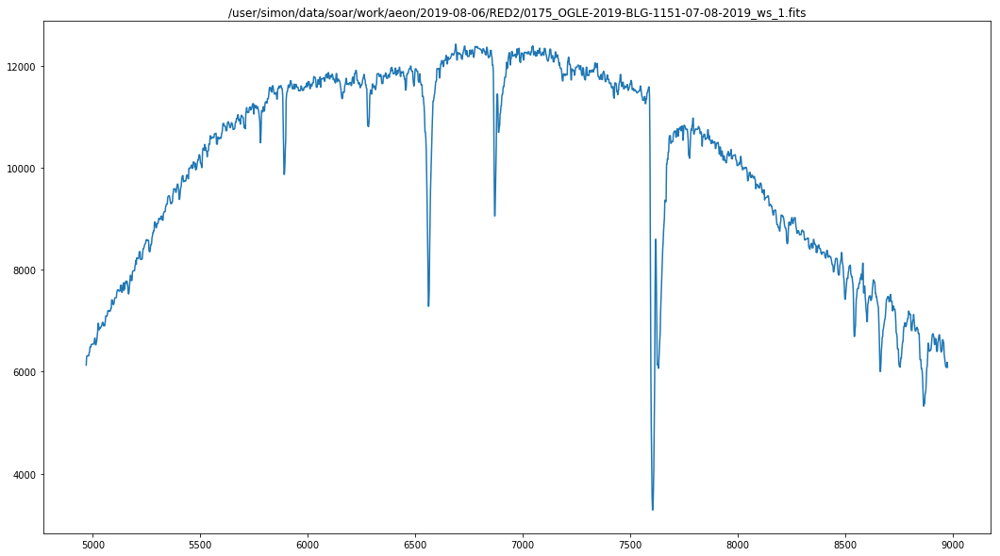

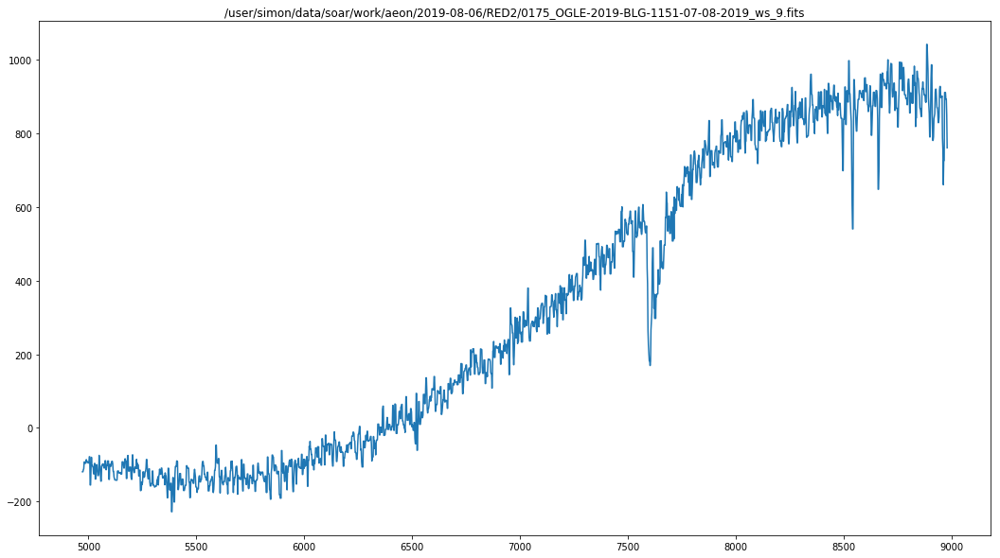

In [36]:
import glob 
from goodman_pipeline.wcs import WCS

wcs = WCS()

for _file in glob.glob(os.path.join(reduced_data_path, '0*ws_*.fits')):
    ccd = CCDData.read(_file, unit='adu')
    w, i = wcs.read(ccd=ccd)
    fig, ax = plt.subplots(figsize=(18,10))
    ax.plot(w,i)
    ax.set(title=_file)
    plt.show()